In [1]:
from os import walk
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

In [2]:
import numpy as np
import os

import tensorflow as tf
assert tf.__version__.startswith('2')

tf.get_logger().setLevel('ERROR')
from absl import logging
logging.set_verbosity(logging.ERROR)

2021-08-21 14:59:13.180799: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [3]:
# Load the labels into a list
classes = {0: "1",
                    1: "0.2",
                    2: "0.5",
                    3: "0.05",
                    4: "0.02",
                    5: "0.1",
                    6: "0.01",
                    7: "2"}

# model.model_spec.config.num_classes

# Define a list of colors for visualization
COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype=np.uint8)

In [4]:
def preprocess_image(image_path, input_size):
    """Preprocess the input image to feed to the TFLite model"""
    img = tf.io.read_file(image_path)
    img = tf.io.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.uint8)
    original_image = img
    resized_img = tf.image.resize(img, input_size)
    resized_img = resized_img[tf.newaxis, :]
    return resized_img, original_image


def set_input_tensor(interpreter, image):
    """Set the input tensor."""
    tensor_index = interpreter.get_input_details()[0]['index']
    input_tensor = interpreter.tensor(tensor_index)()[0]
    input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
    """Retur the output tensor at the given index."""
    output_details = interpreter.get_output_details()[index]
    tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
    return tensor


def detect_objects(interpreter, image, threshold):
    """Returns a list of detection results, each a dictionary of object info."""
    # Feed the input image to the model
    set_input_tensor(interpreter, image)
    interpreter.invoke()

    # Get all outputs from the model
    boxes = get_output_tensor(interpreter, 0)
    classes = get_output_tensor(interpreter, 1)
    scores = get_output_tensor(interpreter, 2)
    count = int(get_output_tensor(interpreter, 3))

    results = []
    for i in range(count):
        if scores[i] >= threshold:
            result = {
            'bounding_box': boxes[i],
            'class_id': classes[i],
            'score': scores[i]
            }
            results.append(result)
    return results


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5, draw=True):
    """Run object detection on the input image and draw the detection results"""
    # Load the input shape required by the model
    _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

    # Load the input image and preprocess it
    preprocessed_image, original_image = preprocess_image(
      image_path,
      (input_height, input_width)
    )

    # Run object detection on the input image
    results = detect_objects(interpreter, preprocessed_image, threshold=threshold)
    
    # Plot the detection results on the input image
    original_image_np = original_image.numpy().astype(np.uint8)
    original_image_pil = Image.fromarray(original_image_np).copy()
    image_copy = Image.fromarray(original_image_np).copy()
    detected_coins = []
    for obj in results:
        # Convert the object bounding box from relative coordinates to absolute
        # coordinates based on the original image resolution
        ymin, xmin, ymax, xmax = obj['bounding_box']
        xmin = int(xmin * original_image_np.shape[1])
        xmax = int(xmax * original_image_np.shape[1])
        ymin = int(ymin * original_image_np.shape[0])
        ymax = int(ymax * original_image_np.shape[0])

        # Find the class index of the current object
        class_id = int(obj['class_id'])

        # Draw the bounding box and label on the image
        if draw:
            color = [int(c) for c in COLORS[class_id]]
            fnt = ImageFont.truetype("Pillow/Tests/fonts/FreeMono.ttf", 15)
            draw = ImageDraw.Draw(image_copy)
            draw.rectangle((xmin, ymin, xmax, ymax), outline ="red")
            # Make adjustments to make the label visible for all objects
            y = ymin - 15 if ymin - 15 > 15 else ymin + 15
            label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
            draw.text((xmin, ymin), label, font=fnt, fill="red")
            
        # cut the coins
        detected_coins.append(original_image_pil.crop((xmin, ymin, xmax, ymax)))

    return image_copy, results, detected_coins


2021-08-21 14:59:14.237351: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-21 14:59:14.299848: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-21 14:59:14.300352: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce GTX 1050 computeCapability: 6.1
coreClock: 1.493GHz coreCount: 5 deviceMemorySize: 3.95GiB deviceMemoryBandwidth: 104.43GiB/s
2021-08-21 14:59:14.300392: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-08-21 14:59:14.305425: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-21 14:59:14.305509: I tensorflow/stream_executor/platform/de

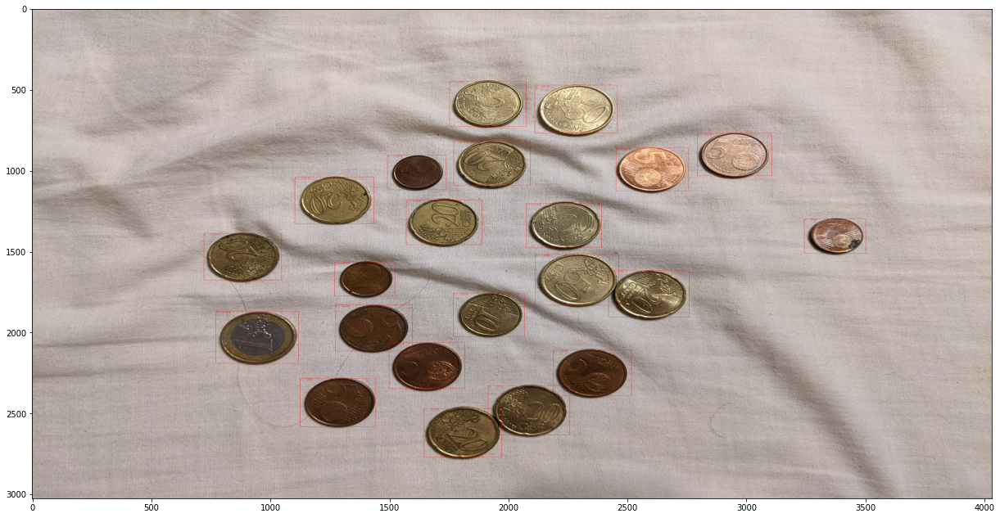

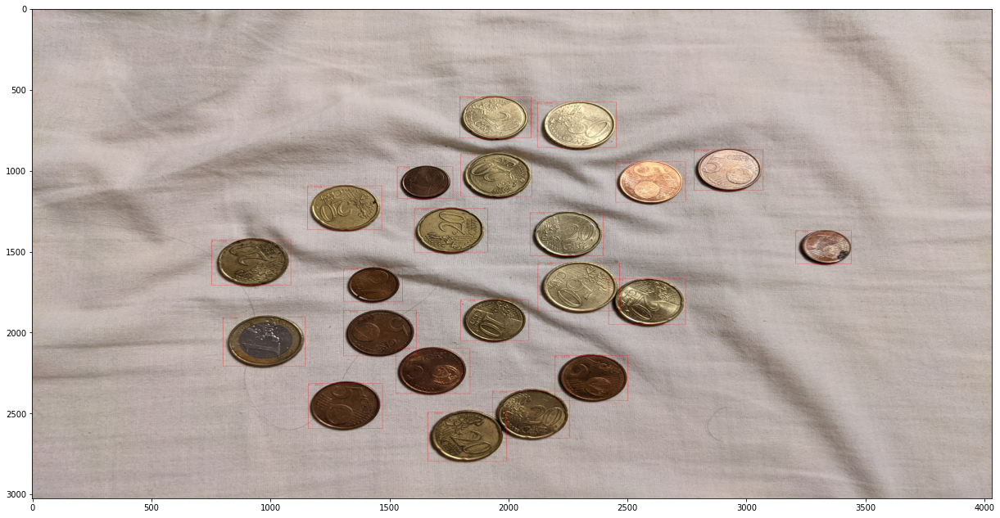

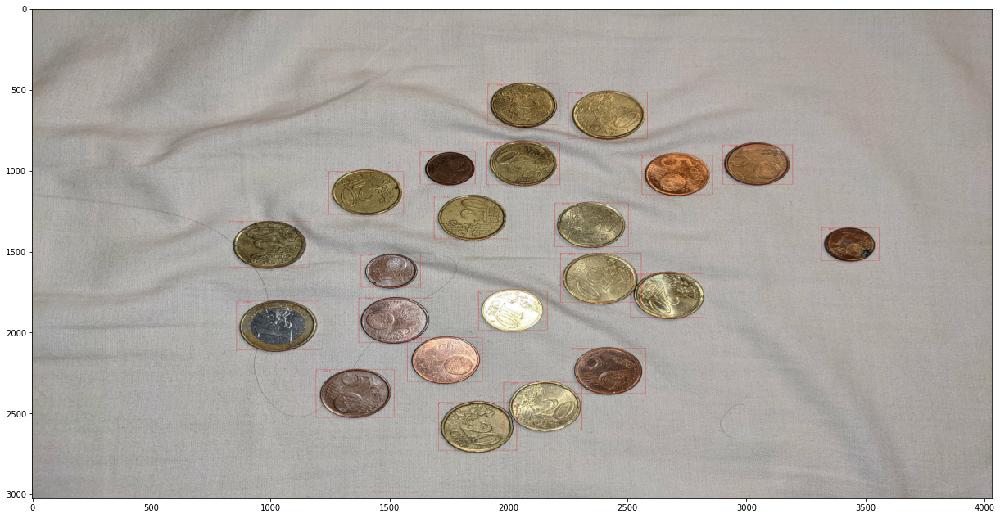

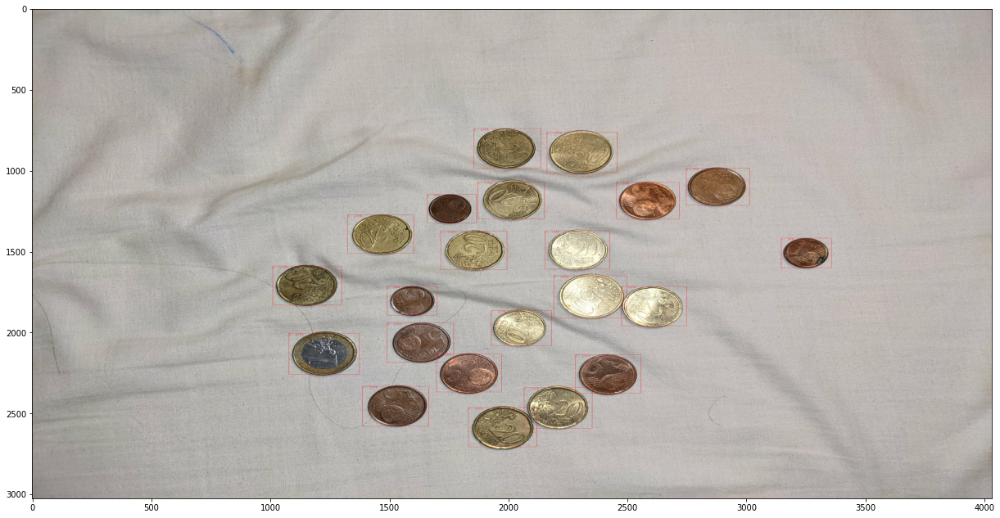

In [5]:
DETECTION_THRESHOLD = 0.6

# Load the TFLite model
interpreter_detector = tf.lite.Interpreter(model_path='detector_one_class.tflite')
interpreter_detector.allocate_tensors()

test_folder = "../data/test/"
test_files_raw = next(walk(test_folder), (None, None, []))[2]
test_files = [test_folder+x for x in test_files_raw]

for test_file in test_files:
    # Run inference and draw detection result on the local copy of the original file
    detection_result_image, results, detected_coins = run_odt_and_draw_results(
        test_file,
        interpreter_detector,
        threshold=DETECTION_THRESHOLD,
        draw=True
    )
    # Show the detection result
    plt.figure(figsize = (21,11))
    plt.imshow(np.asarray(detection_result_image), aspect="auto")
    detection_result_image
    plt.show()

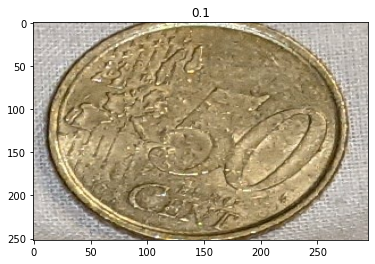

#########################


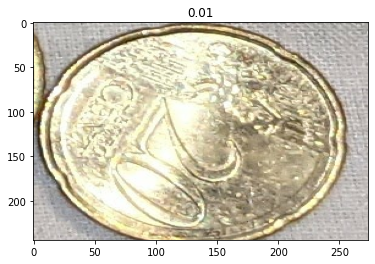

#########################


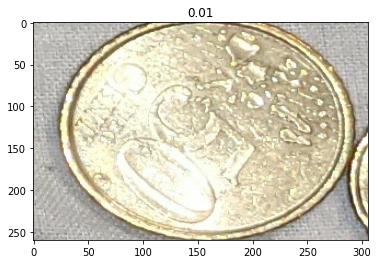

#########################


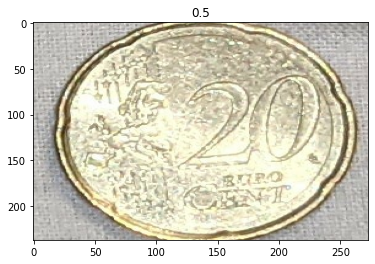

#########################


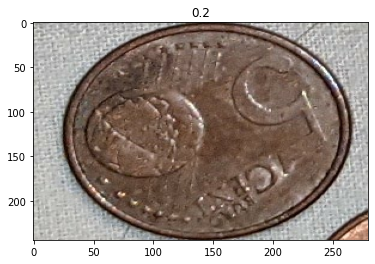

#########################


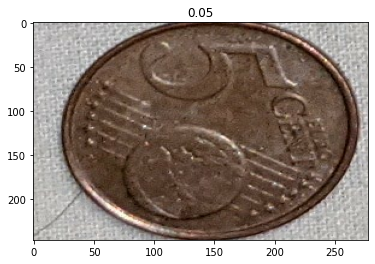

#########################


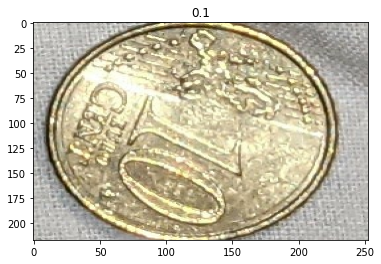

#########################


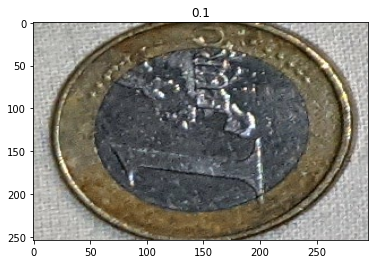

#########################


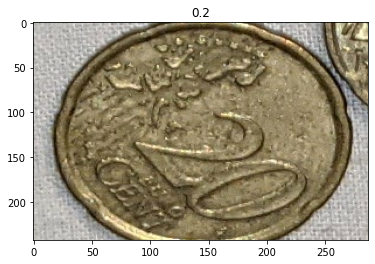

#########################


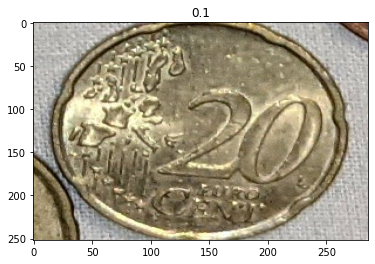

#########################


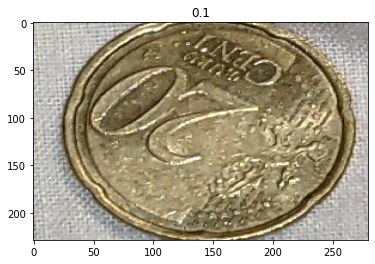

#########################


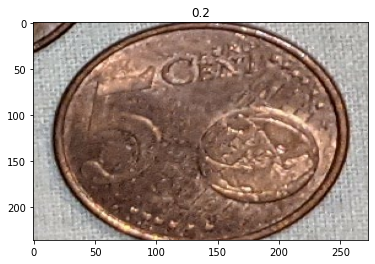

#########################


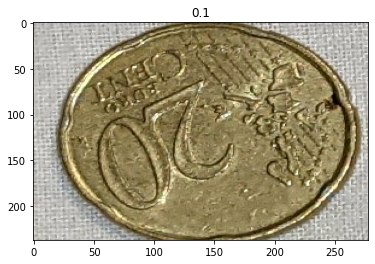

#########################


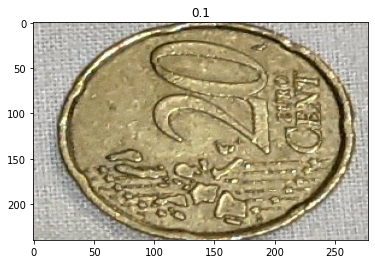

#########################


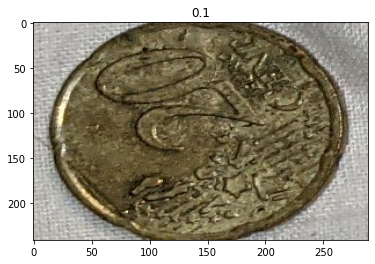

#########################


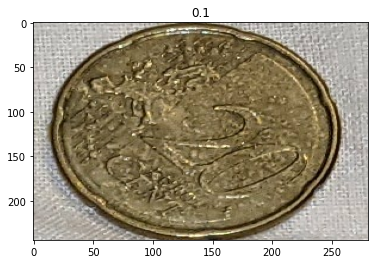

#########################


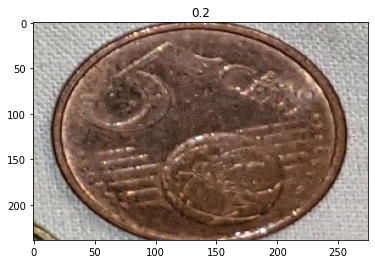

#########################


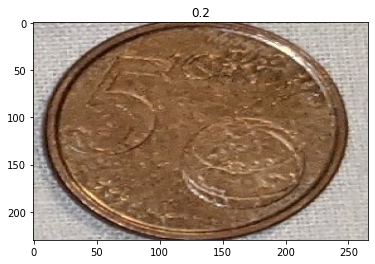

#########################


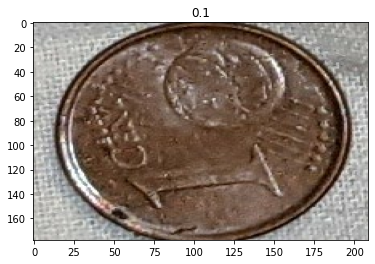

#########################


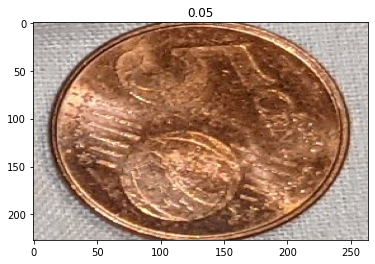

#########################


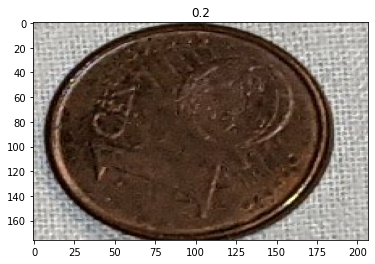

#########################


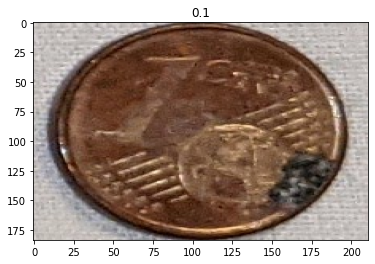

#########################


In [6]:
DETECTION_THRESHOLD = 0.6

classificator_classes = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 2]

for image in detected_coins:

    interpreter_classificator = tf.lite.Interpreter(model_path='model.tflite')
    interpreter_classificator.allocate_tensors()
    _, input_height, input_width, _ = interpreter_classificator.get_input_details()[0]['shape']

    input_size = (input_height, input_width)

    original_image = image
    resized_img = tf.image.resize(image, input_size)
    resized_img = resized_img[tf.newaxis, :]

    # Run object detection on the input image
    set_input_tensor(interpreter_classificator, resized_img)
    interpreter_classificator.invoke()

    output_data = interpreter_classificator.get_tensor(interpreter_classificator.get_output_details()[0]['index'])
    predicted_class = np.argmax(output_data)
    
    plt.imshow(np.asarray(image), aspect="auto")
    plt.title(classificator_classes[predicted_class])
    plt.show()
    print("#"*25)